# Import Library

In [146]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
import stanza
import re
import string
import nltk
import h5py
import pickle
import tensorflow as tf
%matplotlib inline

# Exploratory Data Analysis

In [147]:
df_data = pd.read_csv('data/data_raw.csv')

df_data.head() 

,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety
3,I've shifted my focus to something else but I'...,Anxiety
4,"I'm restless and restless, it's been a month n...",Anxiety


In [148]:
print(df_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53044 entries, 0 to 53043
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   statement  52681 non-null  object
 1   status     53042 non-null  object
dtypes: object(2)
memory usage: 828.9+ KB
None


In [149]:
df_data.shape

(53044, 2)

In [150]:
# Data kosong
df_data.isnull().sum()

statement    363
status         2
dtype: int64

In [151]:
# Hapus data kosong
df_data.dropna(inplace = True)
df_data.isnull().sum()

statement    0
status       0
dtype: int64

In [152]:
# Cek duplikat data
duplicate_rows = df_data[df_data.duplicated()]
print("cek awal: ", duplicate_rows.shape)

# Hapus data duplikat
df_data = df_data.drop_duplicates()
print("setelah dihapus: ", df_data.shape)

cek awal:  (1592, 2)
setelah dihapus:  (51088, 2)


In [153]:
# hapus data >600 karakter
df_data = df_data[df_data['statement'].apply(len) <= 1000]

In [154]:
df_data.shape

(42173, 2)

In [155]:
df_data.head()

,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety
3,I've shifted my focus to something else but I'...,Anxiety
4,"I'm restless and restless, it's been a month n...",Anxiety


## Translate Text

In [12]:
# from deep_translator import GoogleTranslator
# from tqdm import tqdm

# # Inisialisasi translator
# translator = GoogleTranslator(source='en', target='id')

# # Fungsi untuk menerjemahkan teks dengan penanganan error
# def translate_text(text):
#     try:
#         return translator.translate(text)
#     except Exception as e:
#         print(f"Error translating text: {text}\nError: {e}")
#         return text  # Kembalikan teks asli jika terjadi error

# # Menggunakan tqdm untuk menampilkan progress bar
# tqdm.pandas()

# # Terapkan fungsi translate ke kolom 'statement'
# df_data['translated_statement'] = df_data['statement'].progress_apply(translate_text)

# df_data.to_csv('data_hasil_translate.csv', index=False)

# df_data.head()

## EDA #2

In [229]:
df_data = pd.read_csv('data/data_hasil_translate_50k.csv')
df_data.head()

,statement,status,translated_statement
0,oh my gosh,Anxiety,Ya ampun
1,"trouble sleeping, confused mind, restless hear...",Anxiety,"susah tidur, pikiran kacau, hati gelisah. Semu..."
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety,"Semua salah, mundurlah sayang, maju terus ragu..."
3,I've shifted my focus to something else but I'...,Anxiety,Aku mengalihkan fokusku ke hal lain tapi aku m...
4,"I'm restless and restless, it's been a month n...",Anxiety,"Aku gelisah dan gelisah, sudah sebulan sekaran..."


In [230]:
# hapus data >600 karakter
df_data = df_data[df_data['statement'].apply(len) <= 1000]
df_data.shape

(42173, 3)

In [231]:
df_data = df_data[df_data['status'] != 'Personality disorder']

In [232]:
# Mengambil data "Normal" dari df_data
normal_data = df_data[df_data['status'] == 'Normal']

normal_data = normal_data.sort_values(by='translated_statement', ascending=False)  # Urutkan berdasarkan kolom 'text'

normal_data = normal_data.head(5000)  # Mengambil data pertama setelah pengurutan

# Menghapus data "Normal" yang telah diambil
df_data = df_data[~df_data.index.isin(normal_data.index)]

# Menampilkan distribusi baru
print(df_data['status'].value_counts())

status
Normal        11033
Depression    10892
Suicidal       8232
Anxiety        2708
Stress         2050
Bipolar        1676
Name: count, dtype: int64


In [233]:
from collections import Counter

# 1. Menggabungkan semua kata dalam kolom 'translated_text' menjadi satu list
words = ' '.join(df_data['translated_statement']).split()

# 2. Menghitung frekuensi kata
word_counts = Counter(words)

# 3. Membuat daftar kata yang hanya muncul sekali
single_occurrence_words = {word for word, count in word_counts.items() if count == 1}

# 4. Fungsi untuk menghapus kata yang hanya muncul sekali dari setiap baris teks
def remove_single_occurrence_words(text):
    return ' '.join([word for word in text.split() if word not in single_occurrence_words])

In [234]:
df_data['translated_statement'] = df_data['translated_statement'].apply(remove_single_occurrence_words)

In [235]:
# Hapus data kosong
df_data.dropna(inplace = True)
df_data.isnull().sum()

statement               0
status                  0
translated_statement    0
dtype: int64

In [236]:
word_count = df_data['translated_statement'].apply(lambda x: len(x.split()))
max_word_count = word_count.max()

print(f"word count tertinggi: {max_word_count}")

word count tertinggi: 214


In [237]:
# Gabungkan semua teks di kolom 'statement' menjadi satu string
all_words = " ".join(df_data['translated_statement'])

# Tokenisasi dan hitung kata unik
unique_words = set(all_words.split())
unique_word_count = len(unique_words)

# Menampilkan hasil
print(f"Jumlah kata unik: {unique_word_count}")

Jumlah kata unik: 30137


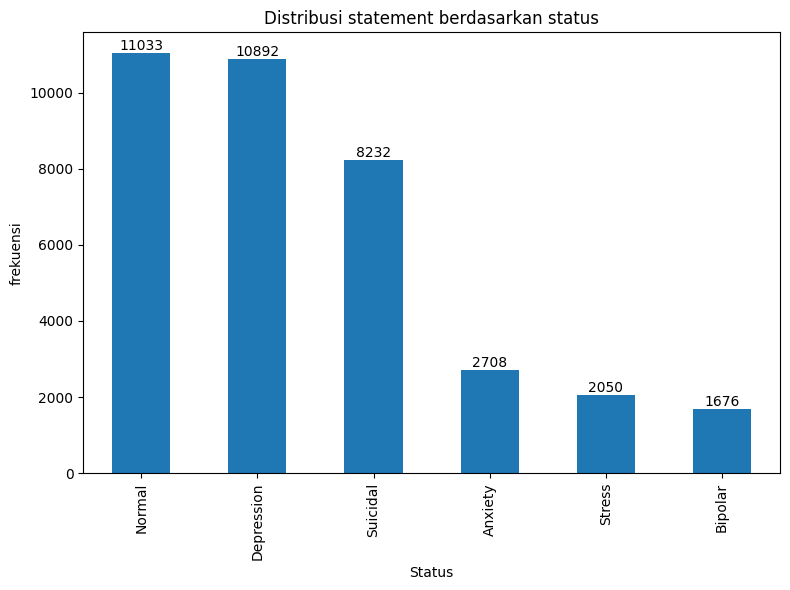

In [238]:
plt.figure(figsize=(8,6))

# get the unique status values and their counts
status_counts = df_data['status'].value_counts()

# create the bar plot
ax = status_counts.plot(kind='bar')

# add the count labels on top of each bar
for i, v in enumerate(status_counts):
    ax.text(i, v, str(v), ha='center', va='bottom')

plt.title('Distribusi statement berdasarkan status')
plt.xlabel('Status')
plt.ylabel('frekuensi')
plt.tight_layout()
plt.show() 

In [239]:
from nltk.tokenize import word_tokenize
# Tokenisasi
tokenisasi = df_data['translated_statement'].apply(word_tokenize)

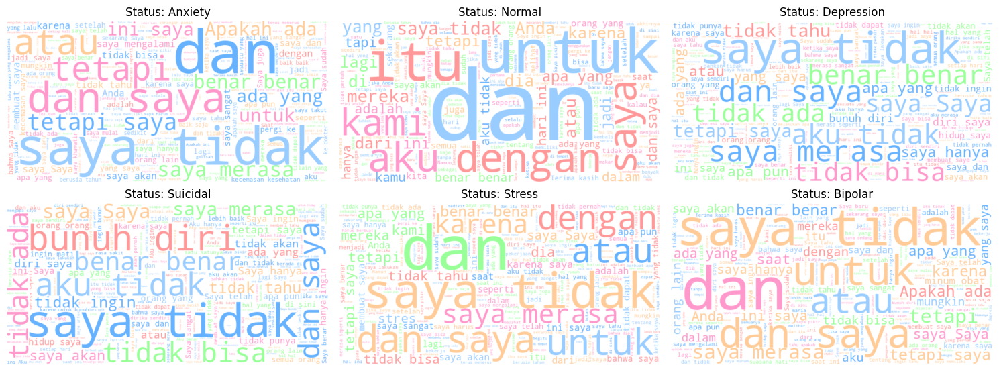

In [240]:
from wordcloud import WordCloud

# Ambil kategori unik dari kolom 'status' (Pastikan hanya ada 6 label)
statuses = df_data['status'].unique()

# Tentukan daftar warna untuk WordCloud
colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF99CC', '#99CCFF']

# Fungsi untuk menentukan warna
def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return random.choice(colors)

# Buat subplots (2 baris x 3 kolom, untuk 6 label)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 6))  # 2 baris dan 3 kolom

# Iterasi untuk setiap status
for i, status in enumerate(statuses):
    # Gabungkan tokenisasi untuk status saat ini
    tokens_data = ' '.join([' '.join(token) for token, label in zip(tokenisasi, df_data['status']) if label == status])

    # Buat WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', color_func=color_func).generate(tokens_data)

    # Tentukan posisi subplot (baris dan kolom)
    row = i // 3  # Baris (0 atau 1)
    col = i % 3   # Kolom (0, 1, atau 2)

    # Plot WordCloud ke subplot
    axes[row, col].imshow(wordcloud, interpolation='bilinear')
    axes[row, col].axis('off')  # Matikan axis
    axes[row, col].set_title(f'Status: {status}', fontsize=12)

# Tampilkan plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [241]:
df_data.head()

,statement,status,translated_statement
0,oh my gosh,Anxiety,Ya ampun
1,"trouble sleeping, confused mind, restless hear...",Anxiety,"susah tidur, pikiran kacau, hati gelisah. Semu..."
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety,"Semua salah, sayang, maju terus ragu. Tetaplah..."
3,I've shifted my focus to something else but I'...,Anxiety,Aku mengalihkan ke hal lain tapi aku masih kha...
4,"I'm restless and restless, it's been a month n...",Anxiety,"Aku gelisah dan gelisah, sudah sebulan sekaran..."


In [227]:
df_data.to_csv('data/data_hasil_EDA_40k.csv', index=False)

# Pre-Processing

In [242]:
df_data = pd.read_csv('data/data_hasil_EDA_40k.csv')
# df_data.shape
df_data.head()

,statement,status,translated_statement
0,oh my gosh,Anxiety,Ya ampun
1,"trouble sleeping, confused mind, restless hear...",Anxiety,"susah tidur, pikiran kacau, hati gelisah. Semu..."
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety,"Semua salah, sayang, maju terus ragu. Tetaplah..."
3,I've shifted my focus to something else but I'...,Anxiety,Aku mengalihkan ke hal lain tapi aku masih kha...
4,"I'm restless and restless, it's been a month n...",Anxiety,"Aku gelisah dan gelisah, sudah sebulan sekaran..."


In [243]:
# Hapus data kosong
df_data.dropna(inplace = True)
df_data.isnull().sum()

statement               0
status                  0
translated_statement    0
dtype: int64

In [244]:
vocab_size = unique_word_count
print(vocab_size)

30137


In [245]:
# 0. Cleaning Text
def clean_text(text):
    text = re.sub(r'[^\w\s]', '', text)             # Menghapus semua karakter selain huruf, angka, dan spasi
    text = re.sub(r'\d+', '', text)                 # Menghapus angka
    text = text.lower()                             # Mengubah teks menjadi huruf kecil
    text = str(text).lower()                        # Mengubah teks menjadi string dan huruf kecil
    text = re.sub(r'\[.*?\]', '', text)             # Menghapus teks dalam tanda kurung siku
    text = re.sub(r'https?://\S+|www\.\S+|\[.*?\]\(.*?\)', '', text)  # Menghapus URL dan markdown links
    text = re.sub(r'<.*?>', '', text)               # Menghapus tag HTML
    text = re.sub(r'@\w+', '', text)                # Menghapus mention @username
    text = re.sub(f'[{re.escape(string.punctuation)}]', '', text)  # Menghapus tanda baca lainnya
    text = re.sub(r'\n', ' ', text)                 # Mengganti newline dengan spasi
    text = re.sub(r'\w*\d\w*', '', text)            # Menghapus kata yang mengandung angka
    text = re.sub(r'\s+', ' ', text)                # Mengganti banyak spasi dengan satu spasi
    text = re.sub(r'(.)\1{2,}', r'\1\1', text)      # Mengurangi huruf yang terulang lebih dari dua kali
    text = re.sub(r'[^\x00-\x7F]+', '', text)       # Menghapus karakter non-ASCII
    text = re.sub(r'\b\w{1,2}\b', '', text)         # Menghapus kata dengan panjang 1-2 karakter
    text = re.sub(r'^\d+$', '', text)               # Menghapus angka yang hanya terdiri dari angka
    text = re.sub(r'\[.*?\]|\(.*?\)', '', text)     # Menghapus teks dalam tanda kurung biasa atau siku
    text = re.sub(r'\b(\w+)\s+\1\b', r'\1', text)   # Menghapus duplikasi kata berurutan
    text = re.sub(r'[^\w\s\.,!?\'";:]', '', text)   # Menghapus karakter selain huruf, angka, spasi, dan tanda baca tertentu
    text = re.sub(r'[^\x00-\x7F]+', '', text)       # Menghapus karakter non-ASCII lainnya
    text = re.sub(r'(\w)\d+(\w)', r'\1\2', text)    # Menghapus angka yang berada di tengah kata
    text = re.sub(r'\t+', ' ', text)                # Mengganti tab dengan spasi

    return text

In [246]:
# 1. Convert text to lowercase
def to_lower(text):
    return text.lower()

In [247]:
# 2. Remove stopwords
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

factory = StopWordRemoverFactory()
stop_words = set(factory.get_stop_words())

manual_stopwords = set({"aku", "kamu", "dia", "mereka", "kita", "kami", "mu", "ku", "nya", "itu", "ini", 
                        "sini", "situ", "sana", "begitu", "yaitu", "yakni", "walaupun", "meskipun", "agar", 
                        "biar", "supaya", "akan", "telah", "baru", "lagi", "masih", "sekarang", "tadi", 
                        "kemarin", "nanti", "besok", "lalu", "kemudian", "sambil", "serta", "tetapi", 
                        "melainkan", "sehingga", "sebab", "karena", "hanya", "saja", "justru", "bahkan", 
                        "memang", "kan", "lah", "pun", "dong", "lho", "kok", "deh", "ya", "nah", "aduh", 
                        "oh", "eh", "loh", "seperti", "bagai", "bagaikan", "umpama", "ibarat", "laksana", 
                        "anda", "gua", "elo", "dong", "toh", "lagi", "apalagi", "yang", "untuk", "ke", "dari", 
                        "pada", "dengan", "oleh", "tanpa", "antara", "di", "sebuah", "seorang", "para", "bagi", 
                        "atas", "dalam", "namun", "demikian", "juga", "malah", "malahan", "berikut", "tersebut", 
                        "jadi", "adalah", "sebagai", "bukan", "tidak", "iya", "nggak", "ga", "enggak", "sangat", 
                        "paling", "amat", "cukup", "lebih", "kurang", "begitu", "maupun", "apalagi", "misalnya", 
                        "sekalipun", "meski", "ketika", "dimana", "siapa", "apa", "kapan", "bagaimana", "selain", 
                        "setelah", "sebelum", "sesudah", "hingga", "selama", "sementara", "sampai", "kemana", 
                        "darimana", "kenapa", "mengapa", "wkwk", "haha", "hehe", "hihi", "loh", "yah", "udah", 
                        "aja", "banget", "abis", "gitu", "tau", "doang", "nih", "tuh", "kayak", "ngapain", "nggak", 
                        "ngga", "yaudah", "yaelah", "anjay", "anjir", "ciyee", "btw", "cmiiw", "gw", "gua", "gue", 
                        "gak", "sih", "loh", "dong", "malah", "makanya", "kenapa", "ngapain", "apaan", "mau", "ye", 
                        "cie", "ciee", "oke", "ok", "sip", "bro", "sis", "mantul", "tapi", "emang", "ya", "masa", 
                        "sumpah", "padahal", "daripada", "udah", "ntar", "yaudah", "bang", "cek", "makasih", "terus", 
                        "anj", "kalo", "ntar", "sama", "soalnya", "jangan", "kek", "kayaknya", "lah", "masih", "eh", 
                        "gak", "loh", "kan", "tak"
})

stop_words = set(factory.get_stop_words()) | manual_stopwords

# Fungsi untuk menghapus stopword
def remove_stopwords(text):
    words = text.split()
    words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(words)

In [248]:
# 3. Lemmatization
nlp = stanza.Pipeline('id', processors='tokenize,lemma', use_gpu=False)

# Fungsi lemmatization
def lemmatize_text(text):
    doc = nlp(text)
    sentences = []

    # Iterasi setiap kalimat dalam dokumen yang sudah diproses
    for sentence in doc.sentences:
        lemmas = [word.lemma for word in sentence.words]
        sentences.append(' '.join(lemmas))

    return ' '.join(sentences)

2024-12-03 21:42:21 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


2024-12-03 21:42:22 INFO: Downloaded file to C:\Users\RafiAchmadfr\stanza_resources\resources.json
2024-12-03 21:42:22 WARNING: Language id package default expects mwt, which has been added
2024-12-03 21:42:22 INFO: Loading these models for language: id (Indonesian):
| Processor | Package      |
----------------------------
| tokenize  | gsd          |
| mwt       | gsd          |
| lemma     | gsd_nocharlm |

2024-12-03 21:42:22 INFO: Using device: cpu
2024-12-03 21:42:22 INFO: Loading: tokenize
c:\Users\RafiAchmadfr\AppData\Local\Programs\Python\Python312\Lib\site-packages\stanza\models\tokenization\trainer.py:82: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the defau

In [249]:
from nltk.tokenize import word_tokenize
from tqdm import tqdm

tqdm.pandas(desc="Preprocessing Text")
def preprocessing_text(text_raw):
    # Cleaning
    text_raw = clean_text(text_raw)
    
    # Convert to lowercase
    text_raw = to_lower(text_raw)
    
    # Remove stopwords
    text_raw = remove_stopwords(text_raw)
    
    # Lemmatize
    text_preprocessing = lemmatize_text(text_raw)
    
    # Tokenized
    text_tokenized = word_tokenize(str(text_preprocessing))

    return text_preprocessing, text_tokenized

In [250]:
df_data[['preprocessed_text', 'tokenized_text']] = df_data['translated_statement'].progress_apply(preprocessing_text).apply(pd.Series)
df_data.head()

Preprocessing Text: 100%|██████████| 36401/36401 [16:21<00:00, 37.09it/s] 


,statement,status,translated_statement,preprocessed_text,tokenized_text
0,oh my gosh,Anxiety,Ya ampun,ampun,[ampun]
1,"trouble sleeping, confused mind, restless hear...",Anxiety,"susah tidur, pikiran kacau, hati gelisah. Semu...",susah tidur pikir kacau hati gelisah semua sel...,"[susah, tidur, pikir, kacau, hati, gelisah, se..."
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety,"Semua salah, sayang, maju terus ragu. Tetaplah...",semua salah sayang maju ragu tetaplah tempat g...,"[semua, salah, sayang, maju, ragu, tetaplah, t..."
3,I've shifted my focus to something else but I'...,Anxiety,Aku mengalihkan ke hal lain tapi aku masih kha...,alih khawatir,"[alih, khawatir]"
4,"I'm restless and restless, it's been a month n...",Anxiety,"Aku gelisah dan gelisah, sudah sebulan sekaran...",gelisah gelisah sebul nak maksudmu,"[gelisah, gelisah, sebul, nak, maksudmu]"


In [251]:
df_data.to_csv('data/data_hasil_prepos_40k.csv', index=False)

# Pre-Trained Word2Vector

In [326]:
df_data = pd.read_csv('data/data_hasil_prepos_40k.csv')

df_data.head()

,statement,status,translated_statement,preprocessed_text,tokenized_text
0,oh my gosh,Anxiety,Ya ampun,ampun,['ampun']
1,"trouble sleeping, confused mind, restless hear...",Anxiety,"susah tidur, pikiran kacau, hati gelisah. Semu...",susah tidur pikir kacau hati gelisah semua sel...,"['susah', 'tidur', 'pikir', 'kacau', 'hati', '..."
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety,"Semua salah, sayang, maju terus ragu. Tetaplah...",semua salah sayang maju ragu tetaplah tempat g...,"['semua', 'salah', 'sayang', 'maju', 'ragu', '..."
3,I've shifted my focus to something else but I'...,Anxiety,Aku mengalihkan ke hal lain tapi aku masih kha...,alih khawatir,"['alih', 'khawatir']"
4,"I'm restless and restless, it's been a month n...",Anxiety,"Aku gelisah dan gelisah, sudah sebulan sekaran...",gelisah gelisah sebul nak maksudmu,"['gelisah', 'gelisah', 'sebul', 'nak', 'maksud..."


In [327]:
word_count = df_data['tokenized_text'].apply(lambda x: len(x.split()))
max_word_count = word_count.max()

print(f"word count tertinggi: {max_word_count}")

word count tertinggi: 157


In [328]:
all_words = " ".join(df_data['tokenized_text'])

unique_words = set(all_words.split())
unique_word_count = len(unique_words)

print(f"Jumlah kata unik: {unique_word_count}")

Jumlah kata unik: 16546


In [329]:
from nltk.tokenize import word_tokenize

df_data['tokenized_text'] = df_data['preprocessed_text'].astype(str).apply(word_tokenize)
df_data.head()

,statement,status,translated_statement,preprocessed_text,tokenized_text
0,oh my gosh,Anxiety,Ya ampun,ampun,[ampun]
1,"trouble sleeping, confused mind, restless hear...",Anxiety,"susah tidur, pikiran kacau, hati gelisah. Semu...",susah tidur pikir kacau hati gelisah semua sel...,"[susah, tidur, pikir, kacau, hati, gelisah, se..."
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety,"Semua salah, sayang, maju terus ragu. Tetaplah...",semua salah sayang maju ragu tetaplah tempat g...,"[semua, salah, sayang, maju, ragu, tetaplah, t..."
3,I've shifted my focus to something else but I'...,Anxiety,Aku mengalihkan ke hal lain tapi aku masih kha...,alih khawatir,"[alih, khawatir]"
4,"I'm restless and restless, it's been a month n...",Anxiety,"Aku gelisah dan gelisah, sudah sebulan sekaran...",gelisah gelisah sebul nak maksudmu,"[gelisah, gelisah, sebul, nak, maksudmu]"


In [330]:
vocab_size = unique_word_count
embedding_dim = max_word_count
max_sequence_length = max_word_count
print(vocab_size, embedding_dim, max_sequence_length)

16546 157 157


In [331]:
sentences = df_data['tokenized_text'].tolist()
print(sentences)

[['ampun'], ['susah', 'tidur', 'pikir', 'kacau', 'hati', 'gelisah', 'semua', 'selaras'], ['semua', 'salah', 'sayang', 'maju', 'ragu', 'tetaplah', 'tempat', 'gelisah', 'tenang'], ['alih', 'khawatir'], ['gelisah', 'gelisah', 'sebul', 'nak', 'maksudmu'], ['istirahat', 'degdegan', 'gimana'], ['rasa', 'takut', 'cemas', 'laku', 'semoga', 'keluarga', 'semua', 'lindung'], ['pernah', 'kah', 'rasa', 'gugup', 'tahu'], ['hari', 'tidur', 'nyenyak', 'gelisah'], ['benarbenar', 'khawatir', 'tangis'], ['selalu', 'gelisah', 'tiap', 'malam', 'aneh'], ['bingung', 'akhirakhir', 'badan', 'enak', 'badan', 'tiap', 'tidur', 'badan', 'selalu', 'gelisah'], ['terkadang', 'butuh', 'masalah', 'tertawa', 'lupa', 'kalau', 'masalah', 'ingat', 'dia', 'gelisah', 'ternyata', 'punya', 'beban', 'sedih', 'bla', 'bla'], ['kekhawatiran'], ['terkadang', 'pikir', 'kamu', 'sendiri', 'lah', 'buat', 'kamu', 'cemas', 'takut', 'pejam', 'mata', 'tidur'], ['bangun', 'tidur', 'degdegan', 'sekaligus', 'coba'], ['harap', 'khawatir', 'mul

In [332]:
# Latih model Word2Vec
word2vec_model = Word2Vec(sentences=sentences, 
                          vector_size=max_sequence_length, 
                          window=10, 
                          min_count=1, 
                          workers=4)

In [333]:
# Simpan Word2Vec model
word2vec_model.save("model_save/embedding_word2vec_model_40k.model")

# Simpan embedding ke file .h5
save_h5 = "model_save/embedding_word2vec_model_40k.h5"

with h5py.File(save_h5, "w") as h5file:
    h5file.create_dataset("vocab", data=word2vec_model.wv.index_to_key, dtype=h5py.string_dtype(encoding='utf-8'))
    h5file.create_dataset("vectors", data=word2vec_model.wv.vectors)

In [334]:
# Buat word_index dari Word2Vec
word_index = {word: i + 1 for i, word in enumerate(word2vec_model.wv.index_to_key)}

# Buat embedding matrix
embedding_matrix = np.zeros((len(word_index) + 1, embedding_dim))
for word, i in word_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [335]:
# Fungsi untuk mengonversi token menjadi indeks
def text_to_sequence(tokens, word_index):
    return [word_index[word] for word in tokens if word in word_index]

# Ubah kolom 'tokenized' menjadi sequence
df_data['sequence'] = df_data['tokenized_text'].apply(lambda x: text_to_sequence(x, word_index))
df_data.head()

,statement,status,translated_statement,preprocessed_text,tokenized_text,sequence
0,oh my gosh,Anxiety,Ya ampun,ampun,[ampun],[1237]
1,"trouble sleeping, confused mind, restless hear...",Anxiety,"susah tidur, pikiran kacau, hati gelisah. Semu...",susah tidur pikir kacau hati gelisah semua sel...,"[susah, tidur, pikir, kacau, hati, gelisah, se...","[1397, 42, 11, 240, 98, 350, 8, 4355]"
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety,"Semua salah, sayang, maju terus ragu. Tetaplah...",semua salah sayang maju ragu tetaplah tempat g...,"[semua, salah, sayang, maju, ragu, tetaplah, t...","[8, 66, 323, 360, 691, 1524, 62, 350, 212]"
3,I've shifted my focus to something else but I'...,Anxiety,Aku mengalihkan ke hal lain tapi aku masih kha...,alih khawatir,"[alih, khawatir]","[434, 119]"
4,"I'm restless and restless, it's been a month n...",Anxiety,"Aku gelisah dan gelisah, sudah sebulan sekaran...",gelisah gelisah sebul nak maksudmu,"[gelisah, gelisah, sebul, nak, maksudmu]","[350, 350, 401, 7230, 6338]"


In [336]:
# Menyimpan word_index ke file menggunakan pickle
with open('data/word_index_6label.pkl', 'wb') as f:
    pickle.dump(word_index, f)

In [337]:
# Padding sequence agar semua memiliki panjang yang sama
from tensorflow.keras.preprocessing.sequence import pad_sequences

padded_sequence = pad_sequences(df_data['sequence'], maxlen=max_sequence_length, padding='post')
print(padded_sequence)

[[1237    0    0 ...    0    0    0]
 [1397   42   11 ...    0    0    0]
 [   8   66  323 ...    0    0    0]
 ...
 [  34  972  207 ...    0    0    0]
 [6839   96    7 ...    0    0    0]
 [  44    9  155 ...    0    0    0]]


In [338]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
status_encoded = label_encoder.fit_transform(df_data['status'])
print(status_encoded)

[0 0 0 ... 0 0 0]


In [339]:
print("label:", label_encoder.classes_)

for encoded_value, class_label in zip(range(len(label_encoder.classes_)), label_encoder.classes_):
    print(f"Encoded value {encoded_value} -> label '{class_label}'")

label: ['Anxiety' 'Bipolar' 'Depression' 'Normal' 'Stress' 'Suicidal']
Encoded value 0 -> label 'Anxiety'
Encoded value 1 -> label 'Bipolar'
Encoded value 2 -> label 'Depression'
Encoded value 3 -> label 'Normal'
Encoded value 4 -> label 'Stress'
Encoded value 5 -> label 'Suicidal'


In [340]:
# Simpan encoder ke file
with open('data/label_encoder_6label.pkl', 'wb') as f:
    pickle.dump(label_encoder, f)

# Data Preparation

In [268]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(padded_sequence,
                                                    status_encoded,
                                                    test_size=0.2,
                                                    random_state=60,
                                                    stratify=status_encoded
                                                    )

In [269]:
print(f'X train: {X_train.shape}\n{X_train}\n')
print(f'X test: {X_test.shape}\n{X_test}\n')
print(f'y train: {y_train.shape}\n{y_train}\n')
print(f'y test: {y_test.shape}\n{y_test}')

X train: (29120, 157)
[[  49    8  108 ...    0    0    0]
 [ 502    0    0 ...    0    0    0]
 [  63   84   11 ...    0    0    0]
 ...
 [  89   92  134 ...    0    0    0]
 [1169    1   50 ...    0    0    0]
 [ 601  233    0 ...    0    0    0]]

X test: (7281, 157)
[[  51 1763  139 ...    0    0    0]
 [   2    5   58 ...    0    0    0]
 [2266    9   30 ...    0    0    0]
 ...
 [  73 1228 1814 ...    0    0    0]
 [ 586   42 1126 ...    0    0    0]
 [  92    6  648 ...    0    0    0]]

y train: (29120,)
[2 3 2 ... 2 5 3]

y test: (7281,)
[2 2 2 ... 5 1 4]


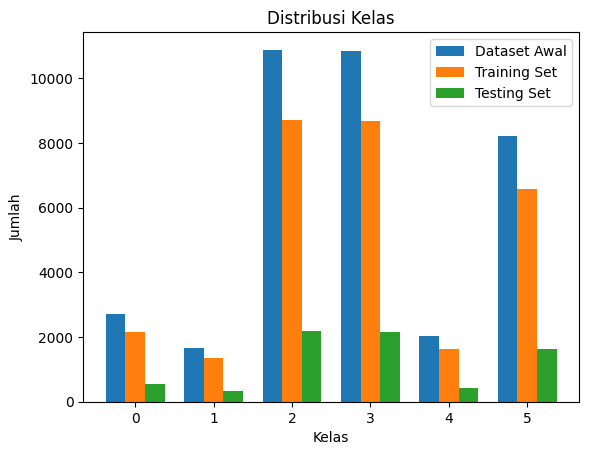

In [270]:
# Hitung distribusi kelas
classes, counts_full = np.unique(status_encoded, return_counts=True)
_, counts_train = np.unique(y_train, return_counts=True)
_, counts_test = np.unique(y_test, return_counts=True)

# Plot distribusi
bar_width = 0.25
x = np.arange(len(classes))

plt.bar(x - bar_width, counts_full, width=bar_width, label="Dataset Awal")
plt.bar(x, counts_train, width=bar_width, label="Training Set")
plt.bar(x + bar_width, counts_test, width=bar_width, label="Testing Set")

plt.xlabel("Kelas")
plt.ylabel("Jumlah")
plt.title("Distribusi Kelas")
plt.xticks(x, classes)
plt.legend()
plt.show()

# Modeling

In [271]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional, Dropout, BatchNormalization
from keras.regularizers import l2
from keras.optimizers import Adam
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [272]:
def create_model():
    model = Sequential([
        # Embedding Layer
        Embedding(input_dim=len(word_index) + 1, 
                  output_dim=embedding_dim, 
                  weights=[embedding_matrix], 
                  trainable=True),

        # Bidirectional LSTM Layer
        Bidirectional(LSTM(256,
                           kernel_regularizer=l2(0.0005),
                           return_sequences=False)),
        Dropout(0.1),
        BatchNormalization(),
        
        # Dense Layer 1
        Dense(48, activation='relu'),
        Dropout(0.5),
        BatchNormalization(),
        
        # Dense Layer 2
        Dense(16, activation='relu'),
        Dropout(0.1),
        BatchNormalization(),
        
        # Output Layer
        Dense(6, activation='softmax')
    ])

    
    model.compile(optimizer = Adam(learning_rate=0.0001),
                loss = 'sparse_categorical_crossentropy',
                metrics = [tf.keras.metrics.SparseCategoricalAccuracy()])
    
    return model

In [273]:
# Callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6
)

# Hitung class weights
class_weights = compute_class_weight(
    'balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))

In [274]:
model = create_model()

# Train & Evaluasi Model

In [275]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[reduce_lr, early_stopping],
    class_weight=class_weights
)

Epoch 1/50
910/910 ━━━━━━━━━━━━━━━━━━━━ 225s 243ms/step - loss: 2.0799 - sparse_categorical_accuracy: 0.3181 - val_loss: 1.3651 - val_sparse_categorical_accuracy: 0.5433 - learning_rate: 1.0000e-04
Epoch 2/50
910/910 ━━━━━━━━━━━━━━━━━━━━ 201s 221ms/step - loss: 1.5305 - sparse_categorical_accuracy: 0.4673 - val_loss: 1.2580 - val_sparse_categorical_accuracy: 0.5817 - learning_rate: 1.0000e-04
Epoch 3/50
910/910 ━━━━━━━━━━━━━━━━━━━━ 225s 246ms/step - loss: 1.3783 - sparse_categorical_accuracy: 0.5281 - val_loss: 1.1976 - val_sparse_categorical_accuracy: 0.6120 - learning_rate: 1.0000e-04
Epoch 4/50
910/910 ━━━━━━━━━━━━━━━━━━━━ 238s 261ms/step - loss: 1.3165 - sparse_categorical_accuracy: 0.5450 - val_loss: 1.1401 - val_sparse_categorical_accuracy: 0.6274 - learning_rate: 1.0000e-04
Epoch 5/50
910/910 ━━━━━━━━━━━━━━━━━━━━ 239s 262ms/step - loss: 1.2509 - sparse_categorical_accuracy: 0.5777 - val_loss: 1.0839 - val_sparse_categorical_accuracy: 0.6550 - learning_rate: 1.0000e-04
Epoch 6/50

In [276]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ (32, 157, 157)         │     1,503,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (32, 512)              │       847,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (32, 512)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (32, 512)              │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 48)               │        24,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (32, 48)               │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (32, 48)               │           192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (32, 16)               │           784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (32, 16)               │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (32, 16)               │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 6)                │           102 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,135,052 (27.22 MB)

 Trainable params: 2,377,966 (9.07 MB)

 Non-trainable params: 1,152 (4.50 KB)

 Optimizer params: 4,755,934 (18.14 MB)

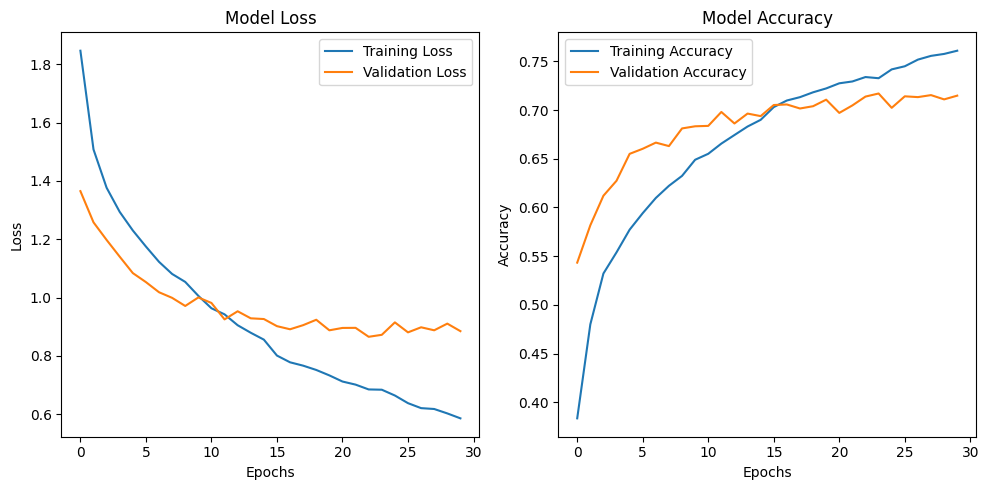

In [277]:
import matplotlib.pyplot as plt

ig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot Loss
axes[0].plot(history.history['loss'], label='Training Loss')
axes[0].plot(history.history['val_loss'], label='Validation Loss')
axes[0].set_title('Model Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

# Plot Accuracy
axes[1].plot(history.history['sparse_categorical_accuracy'], label='Training Accuracy')
axes[1].plot(history.history['val_sparse_categorical_accuracy'], label='Validation Accuracy')
axes[1].set_title('Model Accuracy')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

# Menampilkan subplot
plt.tight_layout()
plt.show()

In [341]:
model.save('model_save/lstm_model_40k.h5')

# Klasifikasi

In [304]:
def preprocess_new_data(text_raw, word_index, max_sequence_length, oov_token="<OOV>"):
    # Cleaning text
    text_clean = clean_text(text_raw)
    
    # Convert to lowercase
    text_lower = to_lower(text_clean)
    
    # Remove stopwords
    text_no_stopwords = remove_stopwords(text_lower)
    
    # Lemmatize the text
    text_lemmatized = lemmatize_text(text_no_stopwords)
    
    # Tokenize the text
    text_tokenized = word_tokenize(text_lemmatized)
    
    # Ganti kata yang tidak ada dalam word_index dengan OOV token
    text_tokenized_with_oov = [word if word in word_index else oov_token for word in text_tokenized]
    
    # Convert text to sequence using the word_index
    text_sequence = text_to_sequence(text_tokenized_with_oov, word_index)
    
    # Pad the sequence to match max_sequence_length
    padded_sequence = pad_sequences([text_sequence], maxlen=max_sequence_length, padding='post')
    
    return padded_sequence

In [305]:
# Fungsi untuk melakukan prediksi pada data baru dengan probabilitas
def classify_new_data_with_prob(model, new_data):
    # Preprocess the input text
    processed_data = preprocess_new_data(new_data, word_index, max_sequence_length)
    
    # Lakukan prediksi menggunakan model (mendapatkan probabilitas untuk setiap kelas)
    predicted_probabilities = model.predict(processed_data)
    
    # Menentukan kelas dengan nilai probabilitas tertinggi
    predicted_class = np.argmax(predicted_probabilities, axis=1)
    
    # Decode label ke status
    predicted_label = label_encoder.inverse_transform(predicted_class)
    
    # Dapatkan probabilitas untuk kelas yang diprediksi
    max_probability = np.max(predicted_probabilities)
    
    # Menampilkan probabilitas untuk setiap label
    class_probabilities = dict(zip(label_encoder.classes_, predicted_probabilities[0]))
    
    return predicted_label[0], max_probability, class_probabilities

In [325]:
# Input manual (data baru)
new_data = "Aku merasa bisa berlari sejauh mungkin pada satu hari, namun besoknya aku merasa sangat lelah hanya untuk bangun dari tempat tidur."

# Klasifikasikan data baru dan dapatkan probabilitas
predicted_status, max_probability, class_probabilities = classify_new_data_with_prob(model, new_data)

# Tampilkan hasil prediksi dan probabilitas
print(f"Status yang diprediksi: {predicted_status}")
print(f"Probabilitas untuk status yang diprediksi: {max_probability:.4f}")
print("\nProbabilitas untuk setiap label:")
for status, prob in class_probabilities.items():
    print(f"{status}: {prob:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Status yang diprediksi: Depression
Probabilitas untuk status yang diprediksi: 0.4847

Probabilitas untuk setiap label:
Anxiety: 0.0105
Bipolar: 0.0281
Depression: 0.4847
Normal: 0.0181
Stress: 0.0210
Suicidal: 0.4376
